#### Bayesian optimization for hyperparam tunning of T_ME coupled AE

In this notebook, we report the progress on hyper-param search. But first we give an overview of the data and the model as we have been changing the M-autoencoder inputs as well as the architecture.

##### Data is coming from Patchseq, Fmost and ME piplines:

In [1]:
# from python
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from IPython import display

#from optuna
import optuna
from optuna.visualization import plot_edf
from optuna.visualization import plot_contour
from optuna.visualization import plot_intermediate_values
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_parallel_coordinate

/home/fahimehb/miniconda3/envs/cplae_met/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
# imports from cplAE_MET
from cplAE_MET.utils.utils import loadpkl, savepkl, set_preproc_paths, set_input_paths, get_all_1d_mask
from cplAE_MET.utils.dataset import MET_exc_inh
from cplAE_MET.utils.plots import plot_z_3d

In [3]:
# path to all the preproc files
dir_preproc_pth = set_preproc_paths(config_file="config_preproc.toml")
# path to the .mat file which is read by the model after all preproc
dir_io_pth = set_input_paths(config_file="config.toml")

In [4]:
# Read the input file
dat = MET_exc_inh.from_file(dir_io_pth['MET_data'])

##### Data modalities overview

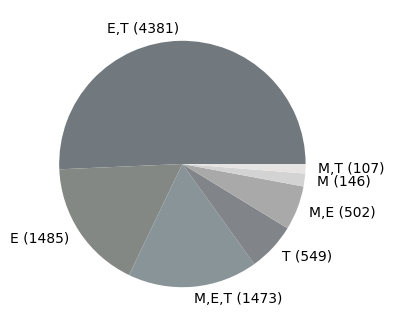

total number of cells: 8643


In [15]:
#get the 1d masks and plot the proportions 
masks = get_all_1d_mask(dat)

fig, ax = plt.subplots(figsize=(4,4))

y = np.array([masks['is_te_only_1d'].sum(), 
              masks['is_e_only_1d'].sum(),
              masks['is_met_1d'].sum(), 
              masks['is_t_only_1d'].sum(), 
              masks['is_me_only_1d'].sum(),
              masks['is_m_only_1d'].sum(),
              masks['is_tm_only_1d'].sum()])

labels = [f"E,T ({masks['is_te_only_1d'].sum()})",
          f"E ({masks['is_e_only_1d'].sum()})",
          f"M,E,T ({masks['is_met_1d'].sum()})", 
          f"T ({masks['is_t_only_1d'].sum()})", 
          f"M,E ({masks['is_me_only_1d'].sum()})", 
          f"M ({masks['is_m_only_1d'].sum()})", 
          f"M,T ({masks['is_tm_only_1d'].sum()})"]

colors = ["#71797E", "#848884", "#899499", "#818589", "#A9A9A9", "#D3D3D3", "#E5E4E2"]

plt.pie(y, colors=colors, labels=labels)
plt.show()

print("total number of cells:", masks['is_te_only_1d'].sum() + masks['is_e_only_1d'].sum() + masks['is_met_1d'].sum() + \
masks['is_t_only_1d'].sum() + masks['is_me_only_1d'].sum() + masks['is_m_only_1d'].sum() + masks['is_tm_only_1d'].sum() )

We are going to add few fMOST cells and many EM cells to this collection.

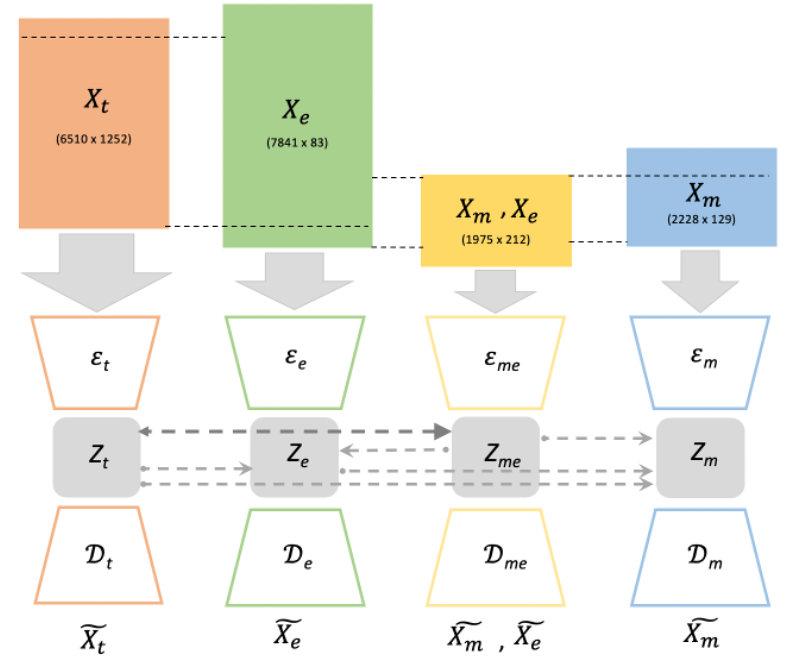

In [46]:
display.Image("/home/fahimehb/Local/new_codes/cplAE_MET/data/proc//cplAE_MET_architecture.png")

#### Results
  - Without any coupling

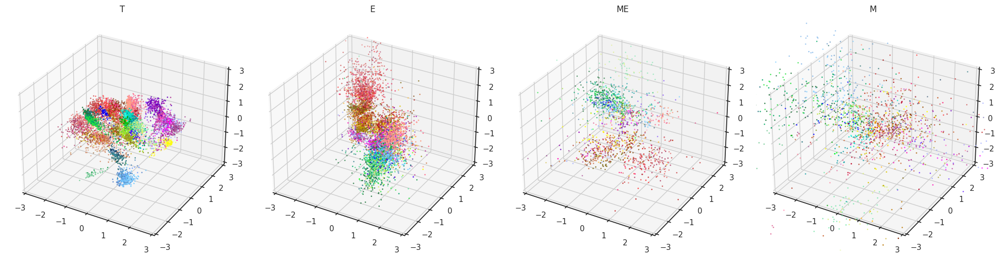

In [17]:
path ="/home/fahimehb/Local/new_codes/cplAE_MET/data/results/Tonly_Eonly_Monly_8643_103MNPCs_26Mfeatures_l3_v0/exit_summary_test.pkl"
output = loadpkl(path)
plot_z_3d(output, xlim=(-3, 3), ylim=(-3,3), zlim=(-3,3))

- With the following directional coupling:

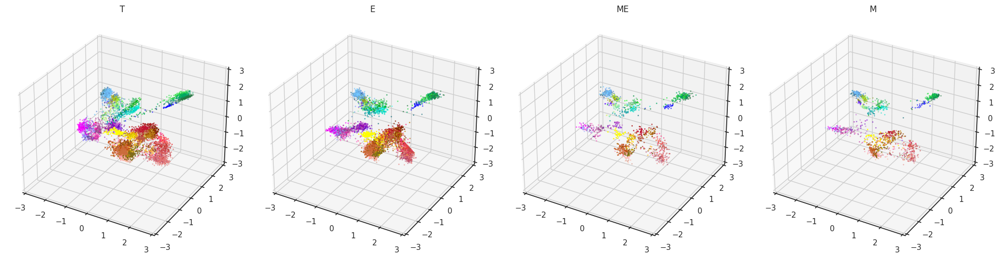

Total number of clusters found with gmm on the embeddings are:
n_cluster_T: 43    n_cluster_ME: 19


,T->E,E->T,T->M,M->T,T->ME,ME->T,ME->M,M->ME,ME->E,E->ME,E->M,M->E
0,1,0,1,0,0.9,0.1,1,0,1,0,1,0


In [40]:
"Test run0"
params = pd.DataFrame({"T->E": [1], "E->T": [0], "T->M": [1], "M->T": [0], "T->ME": [0.9], "ME->T": [0.1],
                       "ME->M": [1], "M->ME": [0], "ME->E": [1], "E->ME": [0], "E->M": [1], "M->E": [0]})
path ="/home/fahimehb/Local/new_codes/cplAE_MET/data/results/TEM_8643_103MNPCs_26Mfeatures_l3_v0/exit_summary_test.pkl"
output = loadpkl(path)
plot_z_3d(output, xlim=(-3, 3), ylim=(-3,3), zlim=(-3,3))
print("Total number of clusters found with gmm on the embeddings are:")
print("n_cluster_T:", 43, "   n_cluster_ME:", 19)
params

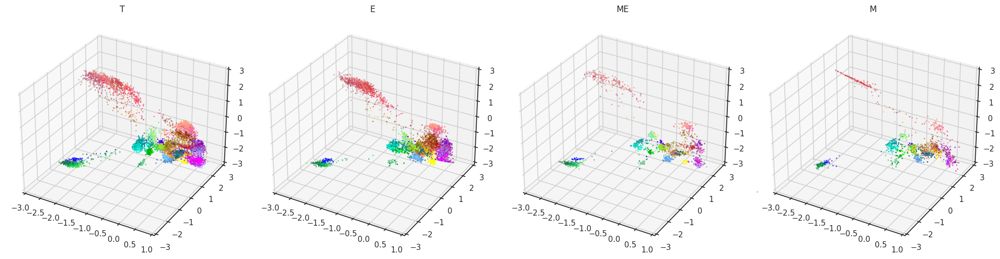

Total number of clusters found with gmm on the embeddings are:
n_cluster_T: 46    n_cluster_ME: 21


,T->E,E->T,T->M,M->T,T->ME,ME->T,ME->M,M->ME,ME->E,E->ME,E->M,M->E
0,5,0.01,5,0.01,5,0.5,5,0.01,5,0.01,5,0.01


In [36]:
"Test run 1"
params = pd.DataFrame({"T->E": [5], "E->T": [0.01], "T->M": [5], "M->T": [0.01], "T->ME": [5], "ME->T": [0.5],
                       "ME->M": [5], "M->ME": [0.01], "ME->E": [5], "E->ME": [0.01], "E->M": [5], "M->E": [0.01]})
path ="/home/fahimehb/Local/new_codes/cplAE_MET/data/results/T_ME_all_connected_higher_range_of_lambdas_v5/exit_summary_test.pkl"
output = loadpkl(path)
plot_z_3d(output, xlim=(-3, 1), ylim=(-3,3), zlim=(-3,3))
print("Total number of clusters found with gmm on the embeddings are:")
print("n_cluster_T:",46,  "   n_cluster_ME:",21 )
params

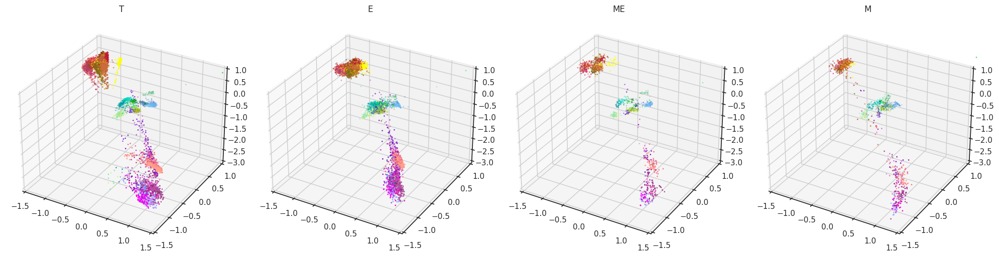

Total number of clusters found with gmm on the embeddings are:
n_cluster_T: 37    n_cluster_ME: 20


,T->E,E->T,T->M,M->T,T->ME,ME->T,ME->M,M->ME,ME->E,E->ME,E->M,M->E
0,5,0.2,5,0.2,5,0.2,5,0.2,5,0.2,5,0.2


In [47]:
"Test run 2"
params = pd.DataFrame({"T->E": [5], "E->T": [0.2], "T->M": [5], "M->T": [0.2], "T->ME": [5], "ME->T": [0.2],
                       "ME->M": [5], "M->ME": [0.2], "ME->E": [5], "E->ME": [0.2], "E->M": [5], "M->E": [0.2]})
path ="/home/fahimehb/Local/new_codes/cplAE_MET/data/results/T_ME_all_connected_higher_range_of_lambdas_v0/exit_summary_test.pkl"
output = loadpkl(path)
plot_z_3d(output, xlim=(-1.5, 1.5), ylim=(-1.5,1), zlim=(-3,1))
print("Total number of clusters found with gmm on the embeddings are:")
print("n_cluster_T:",37,  "   n_cluster_ME:",20 )
params

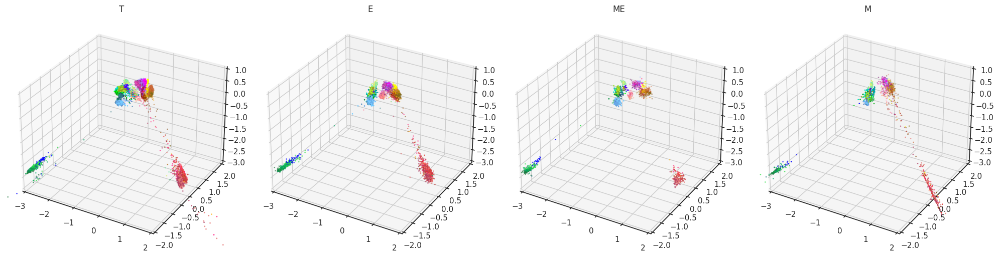

,T->E,E->T,T->M,M->T,T->ME,ME->T,ME->M,M->ME,ME->E,E->ME,E->M,M->E
0,5,1,5,0,5,1,5,0,5,0,5,0


In [54]:
"Test run 3"
params = pd.DataFrame({"T->E": [5], "E->T": [1], "T->M": [5], "M->T": [0], "T->ME": [5], "ME->T": [1],
                       "ME->M": [5], "M->ME": [0], "ME->E": [5], "E->ME": [0], "E->M": [5], "M->E": [0]})
path ="/home/fahimehb/Local/new_codes/cplAE_MET/data/results/T_ME_all_connected_higher_range_of_lambdas_v3/exit_summary_test.pkl"
output = loadpkl(path)
plot_z_3d(output, xlim=(-3, 2), ylim=(-2,2), zlim=(-3,1))
params

#### Hyperparameter optimization  

We have an actual loss function which is the following:

$ Loss = \mathtt{\alpha}_{t} * \mathtt{rec}_{t} + 
         \mathtt{\alpha}_{e} * \mathtt{rec}_{e} +  
         \mathtt{\alpha}_{me} * (\mathtt{rec}_{e_{me}} + \mathtt{rec}_{m_{me}}) +
         \mathtt{\alpha}_{m} * \mathtt{rec}_{m} +\\ 
         \mathtt{\lambda}_{t-e} * \mathtt{cpl}_{t-e} +
         \mathtt{\lambda}_{e-t} * \mathtt{cpl}_{e-t} + \\ 
         \mathtt{\lambda}_{t-me} * \mathtt{cpl}_{t-me} +
         \mathtt{\lambda}_{me-t} * \mathtt{cpl}_{me-t} + \\ 
         \mathtt{\lambda}_{me-e} * \mathtt{cpl}_{me-e} +
         \mathtt{\lambda}_{e-me} * \mathtt{cpl}_{e-me} + \\
         \mathtt{\lambda}_{me-m} * \mathtt{cpl}_{me-m} +
         \mathtt{\lambda}_{m-me} * \mathtt{cpl}_{m-me} +\\
         \mathtt{\lambda}_{m-e} * \mathtt{cpl}_{m-e} +
         \mathtt{\lambda}_{e-m} * \mathtt{cpl}_{e-m} + \\
         \mathtt{\lambda}_{t-m} * \mathtt{cpl}_{t-m} +
         \mathtt{\lambda}_{m-t} * \mathtt{cpl}_{m-t} $


Then we define an objective function for optimization. We have tried various of function:

1. Train a classifier on t representation and then:

   $ Objective = min(\mathtt{Classification}\_\mathtt{acc}_{me}, \mathtt{Classification}\_\mathtt{acc}_{m}, \mathtt{Classification}\_\mathtt{acc}_{e})$ 

2. Compute number of clusters found in each representation and then:

   $ Objective = min(\mathtt{Number}\_\mathtt{clusters}_{t},   \mathtt{Number}\_\mathtt{clusters}_{me},   \mathtt{Number}\_\mathtt{clusters}_{e},   \mathtt{Number}\_\mathtt{clusters}_{m}) $ 

   or

   $ Objective = min(\mathtt{Number}\_\mathtt{clusters}_{t},  \mathtt{Number}\_\mathtt{clusters}_{me})$ 

##### Hyperparameter optimization is represented in equation from as:

$ x^* = argmin_{x \epsilon X} (Objective(x))$ 

we want to find the model hyperparameters that yield the best score on the validation set metric




#### Bayesian optimization

Bayesian approaches, in contrast to random or grid search, keep track of past evaluation results which they use to form a probabilistic model mapping hyperparameters to a probability of a score on the objective function:

$ P (score | hyperparameters) $

In the literature, this model is called a “surrogate” for the objective function and is represented as p(y | x). The surrogate is much easier to optimize than the objective function and Bayesian methods work by finding the next set of hyperparameters to evaluate on the actual objective function by selecting hyperparameters that perform best on the surrogate function. 

The basic idea is: spend a little more time selecting the next hyperparameters in order to make fewer calls to the objective function.


In [3]:
storage = "sqlite:////home/fahimehb/Local/new_codes/cplAE_MET/data/results/optuna_all_connected_objective_v2_gmm_1000trial_2000epochs_range_v3/optuna_all_connected_objective_v2_gmm_1000trial_2000epochs_range_v3.db"
exp_name="optuna_all_connected_objective_v2_gmm_1000trial_2000epochs_range_v3"
study = optuna.create_study(study_name=exp_name,
                            direction="maximize",
                            sampler=optuna.samplers.TPESampler(),
                            pruner=optuna.pruners.HyperbandPruner(),
                            storage=storage,
                            load_if_exists=True)

print("Number of Trials:",len(study.trials))

[I 2023-01-27 11:41:07,060] Using an existing study with name 'optuna_all_connected_objective_v2_gmm_1000trial_2000epochs_range_v3' instead of creating a new one.


Number of Trials: 7754


In [4]:
plot_parallel_coordinate(study)

Search is happening in the following range:
- lambda_tune_T_E, lambda_tune_T_M, lambda_tune_ME_M, lambda_tune_ME_E, lambda_tune_E_M : [2, 50]

- lambda_tune_E_T, lambda_tune_M_T, lambda_tune_M_ME, lambda_tune_E_ME, lambda_tune_M_E : [0.02, 0.1]

- lambda_tune_T_ME, lambda_tune_ME_T: [0.2, 5]

In [5]:
# The best params found so far

for k, v in study.best_params.items():
    print(k, np.exp(v))

lambda_tune_E_M 6.8718232729677435
lambda_tune_E_ME 0.032186063651818336
lambda_tune_E_T 0.019269447811472027
lambda_tune_ME_E 4.361870135736651
lambda_tune_ME_M 38.480265915304585
lambda_tune_ME_T 0.2926250331208226
lambda_tune_M_E 0.05172012020399103
lambda_tune_M_ME 0.03672662484266406
lambda_tune_M_T 0.02604289647503212
lambda_tune_T_E 36.13408306538471
lambda_tune_T_M 14.502804370184679
lambda_tune_T_ME 4.2501540157507485


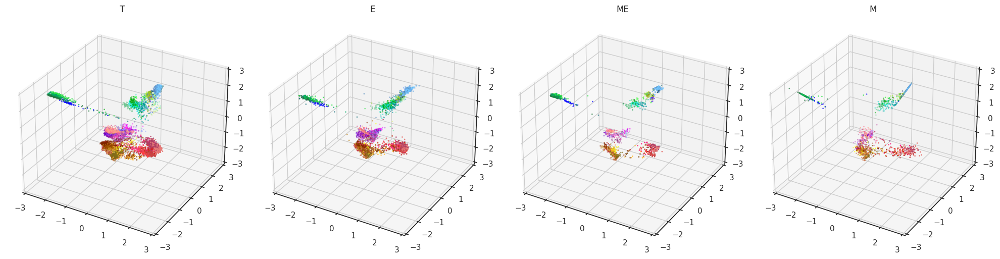

In [10]:
path ="/home/fahimehb/Local/new_codes/cplAE_MET/data/results/optuna_all_connected_objective_v2_gmm_1000trial_2000epochs_range_v3/exit_summary_test_707.pkl"
output = loadpkl(path)
plot_z_3d(output, xlim=(-3, 3), ylim=(-3,3), zlim=(-3,3))

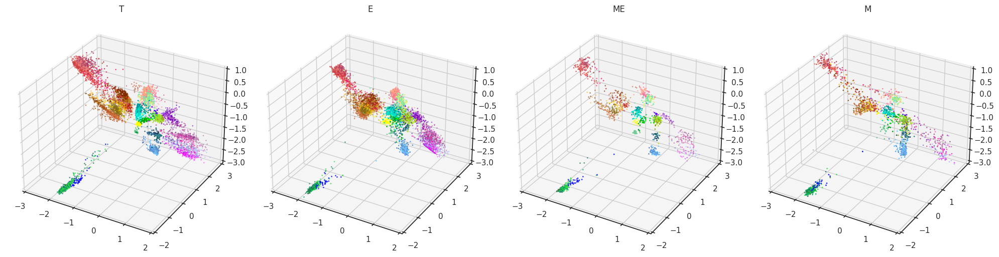

In [14]:
path ="/home/fahimehb/Local/new_codes/cplAE_MET/data/results/optuna_all_connected_objective_v2_gmm_1000trial_2000epochs_range_v3/exit_summary_test.pkl"
output = loadpkl(path)
plot_z_3d(output, xlim=(-3, 2), ylim=(-2,3), zlim=(-3,1))

In [6]:
study.best_trial

FrozenTrial(number=1328, values=[27.0], datetime_start=datetime.datetime(2023, 1, 24, 22, 15, 7, 8055), datetime_complete=datetime.datetime(2023, 1, 24, 23, 53, 51, 272568), params={'lambda_tune_E_M': 1.9274294673791694, 'lambda_tune_E_ME': -3.4362217259634082, 'lambda_tune_E_T': -3.949234452312982, 'lambda_tune_ME_E': 1.4729008956115033, 'lambda_tune_ME_M': 3.650145536254517, 'lambda_tune_ME_T': -1.2288632399858568, 'lambda_tune_M_E': -2.9619084009514243, 'lambda_tune_M_ME': -3.3042533143974646, 'lambda_tune_M_T': -3.648010236067496, 'lambda_tune_T_E': 3.58723654916419, 'lambda_tune_T_M': 2.6743420355665464, 'lambda_tune_T_ME': 1.4469552212798849}, distributions={'lambda_tune_E_M': FloatDistribution(high=4.0, log=False, low=1.0, step=None), 'lambda_tune_E_ME': FloatDistribution(high=-2.0, log=False, low=-4.0, step=None), 'lambda_tune_E_T': FloatDistribution(high=-2.0, log=False, low=-4.0, step=None), 'lambda_tune_ME_E': FloatDistribution(high=4.0, log=False, low=1.0, step=None), 'lamb